In [1]:
# 外部ライブラリのインポート_
import pandas as pd
import numpy as np
from datetime import datetime
import pickle

# 自作パッケージのインポート
from libs_QSM.Prepare_data import Prepare_data
from libs_QSM.Estimate_params import Estimate_params
from libs_QSM.Solve_equilibrium import Solve_equilibrium

In [2]:
# index
jcode = pd.read_csv('data/2020/jcode.csv', dtype={'jcode':str})['jcode'].to_list()
# params
df_param = pd.read_csv('data/2020/param.csv')
param = {}
param['alpha'] = df_param['alpha'].to_list()[0]
param['gamma'] = df_param['gamma'].to_list()[0]
param['psi'] = df_param['psi'].to_list()[0]
param['beta_cns'] = df_param['beta_cns'].to_list()[0]
param['beta_flr'] = df_param['beta_flr'].to_list()[0]
param['beta_chd'] = df_param['beta_chd'].to_list()[0]
# previous exogenous variables
df_scaler = pd.read_csv('data/2000/scaler.csv')
df_p_i = pd.read_csv('data/2000/p_i.csv', dtype={'jcode':str})
df_K_i = pd.read_csv('sources/K_i.csv', dtype={'jcode':str})
df_tau_ij = pd.read_csv('data/2000/tau_ij.csv', dtype={0:str}, index_col=0)
df_t_ij = pd.read_csv('data/2000/t_ij.csv', dtype={0:str}, index_col=0)
prev_exog = {}
prev_exog['T'] = df_scaler['T'].to_list()[0]
prev_exog['N'] = df_scaler['N'].to_list()[0]
prev_exog['L'] = df_scaler['L'].to_list()[0]
prev_exog['p_i'] = df_p_i['p_i'].to_numpy()
prev_exog['K_i'] = df_K_i['K_i'].to_numpy()
prev_exog['tau_ij'] = df_tau_ij.to_numpy()
prev_exog['t_ij'] = df_t_ij.to_numpy()
# previous reference endogenous variables
df_w_j = pd.read_csv('data/2000/w_j.csv', dtype={'jcode':str})
df_q_i = pd.read_csv('data/2000/q_i.csv', dtype={'jcode':str})
df_Q_j = pd.read_csv('data/2000/Q_j.csv', dtype={'jcode':str})
df_Pi_ij = pd.read_csv('data/2000/Pi_ij.csv', dtype={0:str}, index_col=0)
df_n_ij = pd.read_csv('data/2000/n_ij.csv', dtype={0:str}, index_col=0)
df_theta_i = pd.read_csv('data/2000/theta_i.csv', dtype={'jcode':str})
prev_ref = {}
prev_ref['w_j'] = df_w_j['w_j'].to_numpy()
prev_ref['q_i'] = df_q_i['q_i'].to_numpy()
prev_ref['Q_j'] = df_Q_j['Q_j'].to_numpy()
prev_ref['Pi_ij'] = df_Pi_ij.to_numpy()
prev_ref['n_ij'] = df_n_ij.to_numpy()
prev_exog['theta_i'] = df_theta_i['theta_i'].to_numpy()
# nest exogenous variables
df_scaler = pd.read_csv('data/2020/scaler.csv')
df_p_i = pd.read_csv('data/2020/p_i.csv', dtype={'jcode':str})
df_K_i = pd.read_csv('sources/K_i.csv', dtype={'jcode':str})
df_tau_ij = pd.read_csv('data/2020/tau_ij.csv', dtype={0:str}, index_col=0)
df_t_ij = pd.read_csv('data/2020/t_ij.csv', dtype={0:str},index_col=0)
next_exog = {}
next_exog['T'] = df_scaler['T'].to_list()[0]
next_exog['N'] = df_scaler['N'].to_list()[0]
next_exog['L'] = df_scaler['L'].to_list()[0]
next_exog['p_i'] = df_p_i['p_i'].to_numpy()
next_exog['K_i'] = df_K_i['K_i'].to_numpy()
next_exog['tau_ij'] = df_tau_ij.to_numpy()
next_exog['t_ij'] = df_t_ij.to_numpy()
# previous reference endogenous variables
df_w_j = pd.read_csv('data/2020/w_j.csv', dtype={'jcode':str})
df_q_i = pd.read_csv('data/2020/q_i.csv', dtype={'jcode':str})
df_Q_j = pd.read_csv('data/2020/Q_j.csv', dtype={'jcode':str})
df_Pi_ij = pd.read_csv('data/2020/Pi_ij.csv', dtype={0:str}, index_col=0)
df_n_ij = pd.read_csv('data/2020/n_ij.csv', dtype={0:str}, index_col=0)
df_theta_i = pd.read_csv('data/2020/theta_i.csv', dtype={'jcode':str})
next_ref = {}
next_ref['w_j'] = df_w_j['w_j'].to_numpy()
next_ref['q_i'] = df_q_i['q_i'].to_numpy()
next_ref['Q_j'] = df_Q_j['Q_j'].to_numpy()
next_ref['Pi_ij'] = df_Pi_ij.to_numpy()
next_ref['n_ij'] = df_n_ij.to_numpy()
next_exog['theta_i'] = df_theta_i['theta_i'].to_numpy()

In [3]:
f_1 = Prepare_data(jcode) #111
f_1.set_param(param)
f_1.set_exog_prev(prev_exog)
f_1.set_exog_next(next_exog)

f_1.set_ref_prev(prev_ref)
f_1.set_ref_next(next_ref)
# restore the w_j
# f_1.ref_prev['w_j'] = pd.read_csv('/Users/nagampere/File/horkew/analysis/master_thesis/data/2010/w_j.csv')['w_j'].to_numpy()
# f_1.ref_next['w_j'] = pd.read_csv('/Users/nagampere/File/horkew/analysis/master_thesis/data/2020/w_j.csv')['w_j'].to_numpy()
f_1.calc_dep_next()
f_1.calc_dep_prev()

alpha array has been stored.
gamma array has been stored.
psi array has been stored.
beta_cns array has been stored.
beta_flr array has been stored.
beta_chd array has been stored.
T array has been correctly stored.
N array has been correctly stored.
L array has been correctly stored.
p_i array has been stored.
K_i array has been stored.
theta_i array has been stored.
tau_ij array has been stored.
t_ij array has been stored.
T array has been correctly stored.
N array has been correctly stored.
L array has been correctly stored.
p_i array has been stored.
K_i array has been stored.
theta_i array has been stored.
tau_ij array has been stored.
t_ij array has been stored.
q_i array has been stored.
w_j array has been stored.
Q_j array has been stored.
Pi_ij array has been stored.
n_ij array has been stored.
q_i array has been stored.
w_j array has been stored.
Q_j array has been stored.
Pi_ij array has been stored.
n_ij array has been stored.
                            OLS Estimation Summ

In [4]:
f_2 = Estimate_params(f_1)
# f_2.run_eps_prev('OLS')
# f_2.run_eps_next('OLS')
# f_2.merge_eps()
# f_2.run_lmd_dlt()
# f_2.run_eta_rho()
f_2.param['gam*eps'] = 10.3
f_2.param['epsilon'] = 27.5
f_2.param['lambda'] = 0.07
f_2.param['delta'] = 0.35
f_2.param['eta'] = 0.15
f_2.param['rho'] = 0.75

f_2.recover_fundamentals_next()
f_2.recover_fundamentals_prev()

### Check the estimation result ###
A_j


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.205046,1.439029,0.93325,1.613515,1.648137,1.571186,1.444123,1.305966,1.653588,1.290575,...,1.538483,1.765365,1.900623,1.782505,1.5882,1.432685,1.303325,1.389291,1.610197,1.225405


B_i


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.02783,0.990081,0.921301,1.222587,1.198177,1.153469,1.176419,1.101299,1.136566,1.144769,...,1.183698,1.144082,1.127909,1.131142,1.16117,1.126018,1.206796,1.145743,1.078431,1.115529


XE_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.000000,0.004096,0.097458,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.071614,0.053691,0.123016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.014387,0.001804,0.052630,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,105.586237,3.648682,2.785864,0.631223,0.568414,0.487438,6.263877,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,12.349451,21.993105,5.889373,1.102997,1.395862,1.883819,1.665753,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.222688,2.598210,10.267613,0.638905,0.401529,0.250740,0.358415
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.560641,0.074314,0.167429,0.043349,0.660805,0.137328,115.068489,3.064199,0.924070,6.914984
108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.152719,0.042879,0.048948,0.062193,1.353695,0.168121,4.152140,16.708046,0.559826,4.194733
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.043777,0.000000,0.012164,0.007881,0.209656,0.095981,1.111523,0.579162,1.877111,1.126658


Pi_est_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.006339,0.000110,0.000242,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000191,0.000861,0.000168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000319,0.000223,0.000557,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.009228,0.001049,0.000471,0.000045,0.000052,0.000147,0.000360,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.001148,0.007422,0.001266,0.000088,0.000147,0.000656,0.000114,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000222,0.001183,0.003189,0.000062,0.000056,0.000098,0.000026
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000097,0.000064,0.000195,0.000037,0.000216,0.000031,0.014062,0.000457,0.000325,0.000591
108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000025,0.000041,0.000048,0.000042,0.000432,0.000030,0.000353,0.002827,0.000201,0.000337
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000015,0.000000,0.000025,0.000013,0.000147,0.000045,0.000195,0.000189,0.001680,0.000212


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Estimate_params.py:373: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_est_ij-Pi_ij)/Pi_ij*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000004,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004


ΣPi_est_ij
0.9999999999999998
###################################
### Check the estimation result ###
A_j


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.452445,1.660301,1.356025,1.787155,1.997328,2.129691,1.99437,1.791044,1.870898,1.666001,...,1.738661,2.02828,2.427866,2.291492,2.015497,1.973213,1.803719,1.790883,1.965559,1.701416


B_i


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.000094,0.844252,0.843001,1.092446,1.075927,1.055361,1.011887,1.015146,1.011154,1.048588,...,1.084425,1.063579,1.032629,1.081595,1.109994,1.072085,1.123738,1.090728,1.033979,1.049161


XE_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.000000,0.000836,0.001749,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.004491,0.004592,0.000423,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.004886,0.000450,0.003790,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,9.086092,0.387990,0.165997,0.016140,0.025629,0.023342,0.317666,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,1.080230,4.222535,0.409621,0.041002,0.065173,0.108518,0.104972,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.039974,0.000000,0.000000,0.100931,0.834036,2.179868,0.156895,0.097934,0.053775,0.028459
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.386477,0.035976,0.028218,0.010976,0.179397,0.033362,17.808274,0.607934,0.142517,0.485089
108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.095964,0.018868,0.010195,0.024659,0.485465,0.036163,0.688890,4.602372,0.121788,0.323222
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.042917,0.003109,0.003510,0.005441,0.083729,0.019542,0.215370,0.179024,0.591998,0.099897


Pi_est_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.006502,0.000033,0.000043,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000108,0.000921,0.000050,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000120,0.000088,0.000385,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.010801,0.001144,0.000480,0.000045,0.000068,0.000097,0.000304,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.001194,0.009295,0.001422,0.000097,0.000186,0.000503,0.000105,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000014,0.000000,0.000000,0.000303,0.001451,0.004310,0.000074,0.000072,0.000100,0.000025
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000157,0.000081,0.000180,0.000037,0.000268,0.000044,0.017453,0.000556,0.000279,0.000605
108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000034,0.000042,0.000050,0.000059,0.000633,0.000048,0.000442,0.004316,0.000220,0.000340
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000022,0.000012,0.000026,0.000020,0.000186,0.000053,0.000219,0.000249,0.002078,0.000191


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Estimate_params.py:373: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_est_ij-Pi_ij)/Pi_ij*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,-0.000003,-0.000003,-0.000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.000003,-0.000003,-0.000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.000003,-0.000003,-0.000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000003,NaN,NaN,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003,-0.000003


ΣPi_est_ij
1.0
###################################


In [5]:
f_3 = Solve_equilibrium(f_2)
f_3.check_replication_next('root', 'hybr', 10**4) # 10**5で15分, 10*6で1時間半, 10*7で3時間

### Check the result of equilibrium ###
 message: The solution converged.
 success: True
  status: 1
     fun: [-3.110e-13 -9.104e-15 ... -3.643e-17  1.648e-17]
       x: [ 8.538e-01  1.043e+00 ...  3.951e+04  4.071e+04]
  method: hybr
    nfev: 336
    fjac: [[-9.910e-01 -3.863e-02 ... -1.036e-05 -1.067e-05]
           [ 4.619e-02 -9.966e-01 ... -1.661e-06 -1.711e-06]
           ...
           [ 6.837e-06  5.510e-07 ... -8.246e-01  5.101e-01]
           [ 1.099e-04  9.385e-06 ... -2.974e-01 -5.603e-01]]
       r: [-5.845e+01 -2.772e+00 ... -5.001e-08  2.846e-08]
     qtf: [-1.959e-12  4.527e-14 ... -1.842e-16 -9.252e-16]
w_j: 賃金率


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.853833,1.0429,0.771533,0.7848,0.914492,0.866083,0.791,0.8197,0.922967,0.7506,...,0.821367,1.006567,1.0086,0.991667,0.8823,0.837033,0.753945,0.794767,0.8862,0.736333


q_i: 居住地地価


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.193,0.284333,0.11,0.698333,0.784917,0.548083,0.569,0.380333,0.899333,0.459333,...,0.789667,0.845333,0.686333,0.678333,0.628,0.641,0.528,0.625,0.519667,0.509667


N_R_i: 居住人口


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,75320.002044,21048.985647,14536.999061,231829.00594,215980.996287,174378.036126,110832.973624,74159.007031,37113.000255,89414.008157,...,85154.933515,87643.989904,62384.001625,58293.005902,157662.975386,76144.004352,249958.994919,80085.012773,39509.970839,40713.984144


#######################################
### Calculate the endogenous variables ###
π_ij: 通勤割合


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.006339,0.000110,0.000242,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000191,0.000861,0.000168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000319,0.000223,0.000557,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.009228,0.001049,0.000471,0.000045,0.000052,0.000147,0.000360,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.001148,0.007422,0.001266,0.000088,0.000147,0.000656,0.000114,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000222,0.001183,0.003189,0.000062,0.000056,0.000098,0.000026
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000097,0.000064,0.000195,0.000037,0.000216,0.000031,0.014062,0.000457,0.000325,0.000591
108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000025,0.000041,0.000048,0.000042,0.000432,0.000030,0.000353,0.002827,0.000201,0.000337
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000015,0.000000,0.000025,0.000013,0.000147,0.000045,0.000195,0.000189,0.001680,0.000212


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:317: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_ij-self.given_ref['Pi_ij'])/self.given_ref['Pi_ij']*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,-0.000001,-5.092875e-06,-0.000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.000006,2.513535e-06,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.000003,-8.889943e-07,0.000001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,0.000002,0.000008,0.000010,0.000008,0.000010,0.000010,0.000008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,-0.000002,0.000004,0.000006,0.000004,0.000006,0.000006,0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-1.174448e-06,-4.617248e-07,1.875103e-07,-1.810094e-06,-9.212128e-07,-9.492128e-07,-7.590976e-07
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000004,-0.000002,-0.000004,2.148888e-06,2.841318e-06,3.484803e-06,1.364579e-06,2.297054e-06,2.331139e-06,2.418081e-06
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000006,-0.000004,-0.000005,7.959648e-07,1.493360e-06,2.146786e-06,6.386033e-08,9.651543e-07,9.849552e-07,1.105647e-06
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000006,NaN,-0.000006,1.040924e-07,7.918416e-07,1.425265e-06,-5.933493e-07,2.853071e-07,2.897786e-07,4.180256e-07


#####################################


In [6]:
f_3.check_replication_prev('root', 'hybr', 10**4) # 10**5で15分, 10*6で1時間半, 10*7で3時間

### Check the result of equilibrium ###
 message: The solution converged.
 success: True
  status: 1
     fun: [-5.586e-13 -2.620e-14 ... -6.939e-18  1.128e-17]
       x: [ 9.707e-01  1.239e+00 ...  3.817e+04  4.248e+04]
  method: hybr
    nfev: 336
    fjac: [[-9.962e-01 -1.944e-02 ... -8.583e-06 -9.551e-06]
           [ 2.226e-02 -9.986e-01 ... -1.018e-06 -1.133e-06]
           ...
           [-1.333e-05 -1.014e-06 ... -7.697e-01  5.860e-01]
           [ 2.163e-04  1.646e-05 ... -8.275e-02 -4.678e-02]]
       r: [-5.675e+01 -1.184e+00 ... -4.551e-08 -2.996e-09]
     qtf: [ 2.506e-11  1.743e-11 ... -2.131e-16  2.532e-15]
w_j: 賃金率


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.970733,1.239167,1.154167,0.957567,1.078267,1.086267,1.096,1.0947,1.128533,0.938433,...,0.938,1.165433,1.275733,1.203967,1.0896,1.112867,1.003167,1.0187,1.1229,1.047533


q_i: 居住地地価


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.310666,0.289332,0.211667,0.688667,0.767333,0.643333,0.702667,0.533,0.819,0.636667,...,0.895,0.949,0.872,0.835,0.803,0.783,0.762667,0.783333,0.696,0.728


N_R_i: 居住人口


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,61480.857044,10079.975977,5547.986014,135080.998966,136523.002792,138377.981639,70516.003255,66228.001237,22733.989026,57215.995119,...,53704.012045,53450.996176,32912.031579,52565.991174,148212.990617,76173.002018,213835.986618,79285.025989,38172.000478,42476.994488


#######################################
### Calculate the endogenous variables ###
π_ij: 通勤割合


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.006502,0.000033,0.000043,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000108,0.000921,0.000050,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000120,0.000088,0.000385,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.010801,0.001144,0.000480,0.000045,0.000068,0.000097,0.000304,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.001194,0.009295,0.001422,0.000097,0.000186,0.000503,0.000105,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000014,0.000000,0.000000,0.000303,0.001451,0.004310,0.000074,0.000072,0.000100,0.000025
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000157,0.000081,0.000180,0.000037,0.000268,0.000044,0.017453,0.000556,0.000279,0.000605
108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000034,0.000042,0.000050,0.000059,0.000633,0.000048,0.000442,0.004316,0.000220,0.000340
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000022,0.000012,0.000026,0.000020,0.000186,0.000053,0.000219,0.000249,0.002078,0.000191


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:317: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_ij-self.given_ref['Pi_ij'])/self.given_ref['Pi_ij']*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,-0.000251,-0.000311,-0.000301,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.000150,-0.000205,-0.000196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.000172,-0.000229,-0.000220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,-6.263213e-07,3.761308e-07,0.000003,1.860622e-06,2.336386e-06,2.310318e-07,-0.000006,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,-2.357292e-06,-1.401582e-06,0.000001,4.682561e-08,5.092603e-07,-1.556850e-06,-0.000007,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000003,NaN,NaN,-0.000004,-0.000003,-2.428194e-06,-0.000003,-0.000004,-0.000004,-0.000004
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000003,-0.000004,-1.275414e-06,-0.000004,-0.000003,-2.239825e-06,-0.000003,-0.000004,-0.000003,-0.000004
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000001,-0.000002,2.851619e-08,-0.000002,-0.000002,-9.835440e-07,-0.000002,-0.000002,-0.000002,-0.000003
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000002,-0.000003,-2.449017e-07,-0.000002,-0.000002,-1.234597e-06,-0.000002,-0.000003,-0.000002,-0.000003


#####################################


In [ ]:
# f_3 = Solve_equilibrium(f_2)
# set the new exogenous variables
df_sim_t_ij = pd.read_csv('data/2020/t_ij_sim.csv', dtype={0:str}, index_col=0)
new_exog = f_3.exog_next
new_exog['t_ij'] = df_sim_t_ij.to_numpy()
f_3.simulate_new_exog_next(new_exog, 'minimize', 'Nelder-Mead', 10**5)

# ファイルに保存
dirname = 'simulation_tx_t_ij'
res = f_3.res_next
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S") # 現在時刻を取得
with open(f"results/{dirname}/{timestamp}.pkl", "wb") as f: pickle.dump(res, f)

iteration:  0 func= 183.5528412220398


iteration:  10000 func= 11.038014313344135
iteration:  20000 func= 1.9303357756037254
iteration:  30000 func= 0.6503143685658547
iteration:  40000 func= 0.37087381682580417
iteration:  50000 func= 0.27069591408810595
iteration:  60000 func= 0.18058210937263192
iteration:  70000 func= 0.09425020427114054
iteration:  80000 func= 0.034668512612061116
iteration:  90000 func= 0.007550992817729515
iteration:  100000 func= 0.0015859179871092358
### Check the result of equilibrium ###
       message: Maximum number of iterations has been exceeded.
       success: False
        status: 2
           fun: 0.0006261337962276107
             x: [ 8.191e-01  1.036e+00 ...  3.974e+04  4.038e+04]
           nit: 100000
          nfev: 105738
 final_simplex: (array([[ 8.191e-01,  1.036e+00, ...,  3.974e+04,
                         4.038e+04],
                       [ 8.191e-01,  1.036e+00, ...,  3.974e+04,
                         4.038e+04],
                       ...,
                       [ 8.191e

,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.819076,1.036253,0.839533,0.785935,0.90699,0.859697,0.789435,0.81371,0.923339,0.805884,...,0.821494,1.001226,1.005483,0.989572,0.878405,0.836218,0.75037,0.793191,0.882232,0.730591


q_i: 居住地地価


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.253714,0.250357,0.058164,0.703515,0.817104,0.567408,0.582025,0.390187,0.904074,0.288668,...,0.808539,0.86663,0.696082,0.682595,0.635885,0.657825,0.539225,0.629977,0.532853,0.510567


N_R_i: 居住人口


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,99877.925349,20706.268218,13609.629156,238611.006163,220891.35332,177682.613807,110756.730926,74986.504521,36436.7768,104651.55128,...,85004.498342,88081.777883,61998.721594,57508.496444,156941.942352,76231.021183,250780.220472,79108.077751,39742.160017,40375.276968


#######################################
### Calculate the endogenous variables ###
π_ij: 通勤割合


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,8.475389e-03,2.041982e-04,0.001016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1.276505e-04,7.658639e-04,0.000350,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,3.103108e-07,2.955276e-07,0.000002,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000e+00,0.000000e+00,0.000000,0.009378,0.000973,0.000440,0.000044,0.000049,0.000148,0.000708,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000e+00,0.000000e+00,0.000000,0.001277,0.007563,0.001299,0.000095,0.000150,0.000725,0.000242,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000227,0.001184,0.003294,0.000062,0.000057,0.000098,0.000025
107,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000103,0.000065,0.000202,0.000038,0.000221,0.000032,0.014319,0.000477,0.000332,0.000585
108,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000026,0.000041,0.000048,0.000043,0.000426,0.000030,0.000347,0.002854,0.000198,0.000322
109,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000016,0.000000,0.000025,0.000013,0.000151,0.000047,0.000199,0.000198,0.001719,0.000210


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:317: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_ij-self.given_ref['Pi_ij'])/self.given_ref['Pi_ij']*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,33.699605,85.191941,320.466609,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-33.049172,-11.083566,108.806090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-99.902695,-99.867193,-99.729911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,1.631825,-7.269776,-6.540669,-1.622911,-6.493146,0.656665,96.526058,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,11.295336,1.900622,2.639943,7.860900,2.596720,10.535154,112.782519,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.293646,0.070625,3.283107,-0.370373,2.249406,-0.000038,-3.195478
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.677667,1.367684,3.536059,4.488076,2.188697,5.559043,1.822326,4.537714,2.130800,-1.115632
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.998968,-2.114151,-0.052056,0.862864,-1.311324,1.917096,-1.644558,0.956168,-1.367226,-4.440570
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.666862,NaN,3.671221,4.590483,2.345366,5.595674,1.928622,4.596153,2.303776,-0.895095


#####################################


In [16]:
f_3 = Solve_equilibrium(f_2)
# set the new param
new_param = f_3.param
new_param['mu_room'] = 0.03
f_3.simulate_new_param(new_param, 'minimize', 'Nelder-Mead', 10**5)

/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:221: OptimizeWarning: Initial guess is not within the specified bounds
  result = opt.minimize(fun=self.objective_equations, x0=x0_init, tol=1e-9, method=method, options=options, bounds=bounds)


iteration:  0 func= 2999573794.973283
iteration:  10000 func= 766650966.9449686
iteration:  20000 func= 382975048.40703857
iteration:  30000 func= 328881709.5201678
iteration:  40000 func= 275712707.4717351
iteration:  50000 func= 241974548.3385533
iteration:  60000 func= 207478402.81003115
iteration:  70000 func= 178974232.69287363
iteration:  80000 func= 160539134.50330612
iteration:  90000 func= 148764018.96210828
iteration:  100000 func= 137256589.69035783
### Check the result of equilibrium ###
       message: Maximum number of iterations has been exceeded.
       success: False
        status: 2
           fun: 134867001.93607432
             x: [ 1.301e+00  4.799e+00 ...  5.368e-01  5.309e-01]
           nit: 100000
          nfev: 102929
 final_simplex: (array([[ 1.301e+00,  4.799e+00, ...,  5.368e-01,
                         5.309e-01],
                       [ 1.300e+00,  4.802e+00, ...,  5.369e-01,
                         5.310e-01],
                       ...,
           

,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.301033,4.799327,0.521662,1.297815,0.666698,3.31485,4.576006,0.698327,2.144629,0.806571,...,3.062895,2.539975,1.797534,2.576111,1.156982,0.889852,0.716787,1.069411,1.462832,0.654123


q_i: 居住地地価


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.417247,0.219637,0.246263,0.576163,0.612094,0.639512,0.394076,0.281314,0.195673,0.206952,...,0.483942,0.40069,0.547393,0.245867,0.287115,0.239967,0.328224,0.325413,0.183448,0.296353


N_R_i: 居住人口


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,16414.229541,171358.119785,20260.132254,13130.056627,3317.529304,905.04251,64524.211884,8388.012105,1.011112e+06,22781.015349,...,5558.264366,1653.747303,33176.665852,61948.770928,38337.345006,68190.36929,10207.345806,27142.049594,36202.406692,16867.499093


#######################################
### Calculate the endogenous variables ###
π_ij: 通勤割合


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,9.076410e-07,6.496151e-07,0.000000,4.628984e-08,0.000000e+00,0.000020,0.000010,0.000000e+00,1.043844e-06,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,9.129499e-06,6.565931e-06,0.000186,4.944264e-07,3.596068e-06,0.000207,0.000112,2.493757e-06,1.205318e-05,1.091937e-06,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,1.187695e-06,8.089700e-07,0.000014,6.481756e-08,4.059608e-07,0.000025,0.000014,2.365817e-07,1.639339e-06,1.039748e-07,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
3,6.281871e-07,5.328133e-07,0.000000,3.536471e-08,0.000000e+00,0.000017,0.000009,0.000000e+00,1.003240e-06,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,7.408477e-08,1.048182e-07,0.000000,5.057766e-09,0.000000e+00,0.000003,0.000002,0.000000e+00,4.673427e-08,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,4.204265e-07,1.124091e-06,4.446555e-07,2.690126e-07,3.817850e-06,2.410334e-06,4.229838e-08,1.664514e-06,2.416466e-07,2.574869e-07
107,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,2.033184e-07,0.000000e+00,0.000000e+00,0.000000e+00,7.999276e-07,5.651738e-07,1.246610e-08,3.421781e-07,5.527370e-08,7.105931e-08
108,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,6.338982e-07,4.469744e-07,2.246881e-07,4.308694e-07,9.182959e-07,6.753491e-07,1.085810e-08,7.251300e-07,9.732277e-08,1.164112e-07
109,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,1.039308e-06,1.020589e-06,0.000000e+00,9.821868e-07,3.280648e-06,2.466781e-06,4.798280e-08,2.218517e-06,3.201110e-07,5.482358e-07


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:322: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_ij-self.ref_next['Pi_ij'])/self.ref_next['Pi_ij']*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,-99.955806,-99.866907,-100.000000,-99.974072,-100.000000,-89.435283,-80.889243,-100.000000,-98.903893,-100.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-95.005608,-99.579118,84.965654,-99.765108,-91.517908,17.346988,145.408834,-92.472586,-85.362231,-90.509026,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-99.574282,-99.846208,-99.273269,-99.960743,-99.143597,-88.055047,-78.599398,-99.779011,-98.985539,-99.219116,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-99.204162,-99.814472,-100.000000,-99.996908,-100.000000,-93.833529,-89.045185,-100.000000,-98.914982,-100.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-99.818886,-99.928124,-100.000000,-99.997627,-100.000000,-98.460963,-98.799030,-100.000000,-99.957611,-100.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-98.789338,-95.289002,-97.341213,-99.278458,-99.600798,-99.969953,-99.992014,-99.553294,-99.870225,-99.647640
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-98.368624,NaN,NaN,NaN,-99.662196,-99.955208,-99.999634,-99.428427,-99.947374,-99.741443
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-98.965081,-98.354534,-99.491736,-99.153797,-97.962060,-99.853447,-99.965795,-99.975954,-99.954614,-99.967639
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-91.048938,-93.612936,NaN,-96.251911,-75.939506,-98.427891,-99.899005,-98.902137,-99.982135,-99.757464


#####################################


In [4]:
from libs_QSM.Plot_gdf import plot_gdf
from libs_QSM.Plot_gdf_tx import plot_gdf_tx
import os
import geopandas as gpd
import numpy as np

gdf = gpd.read_file(os.path.join(os.getcwd(), 'data/setup_2000_2020/jcode.geojson'), dtype={'JCODE':str})

子供の総数の推定値:  3318554.4715027506
子供の総数の実測値:  3326439.5474385065
推定値と実測値の差:  -7885.075935755856


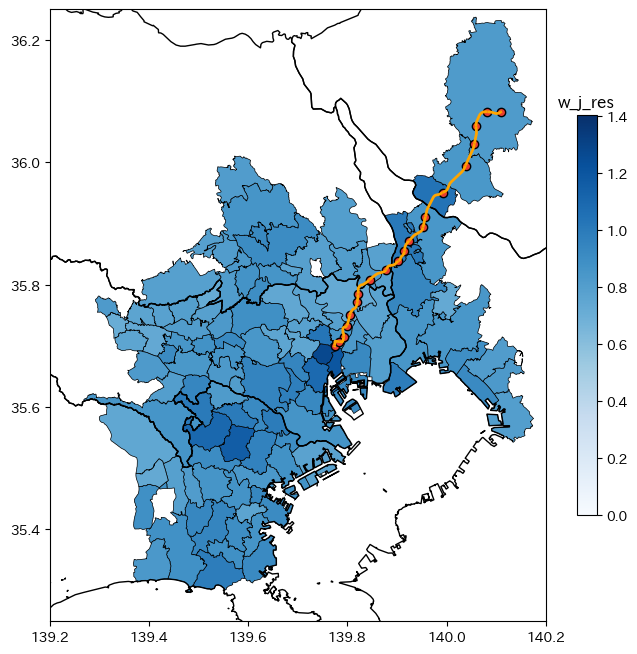

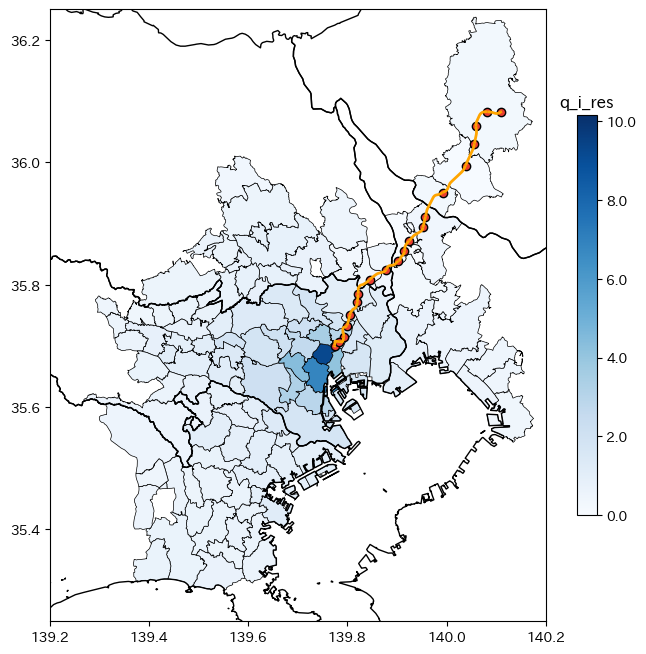

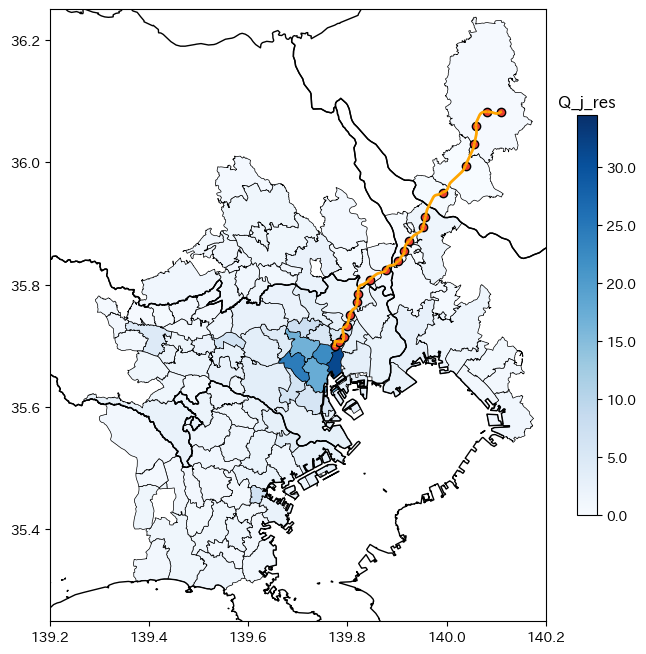

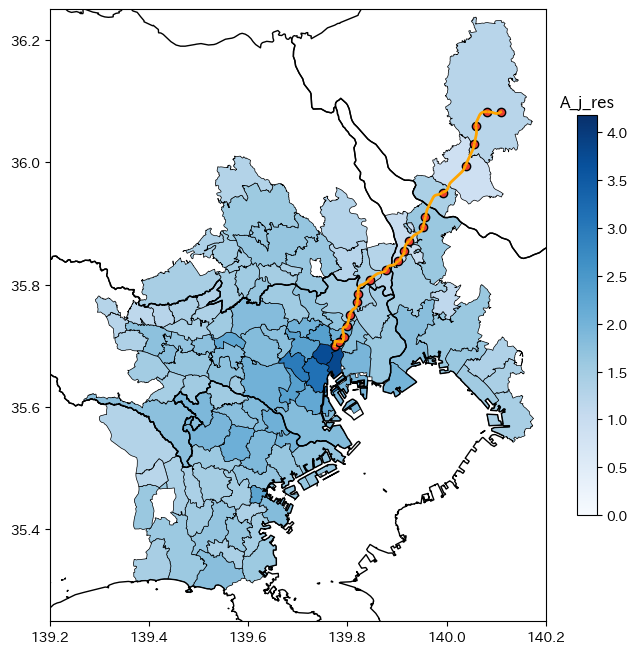

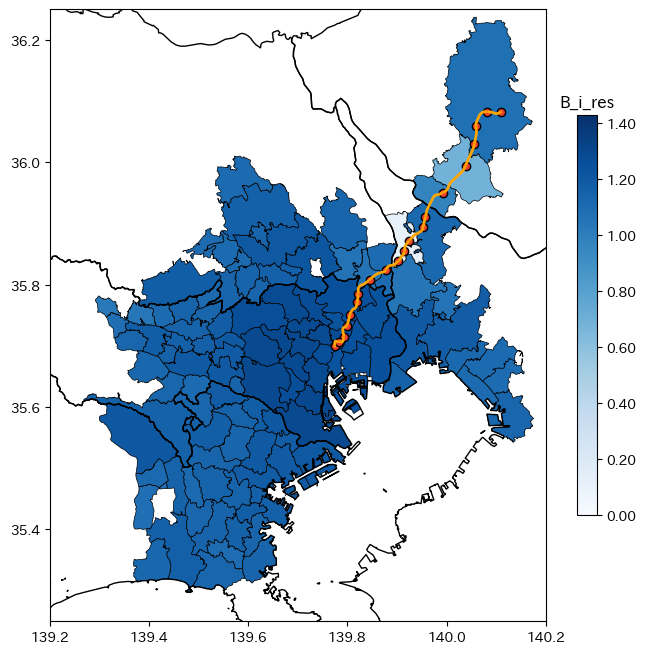

...

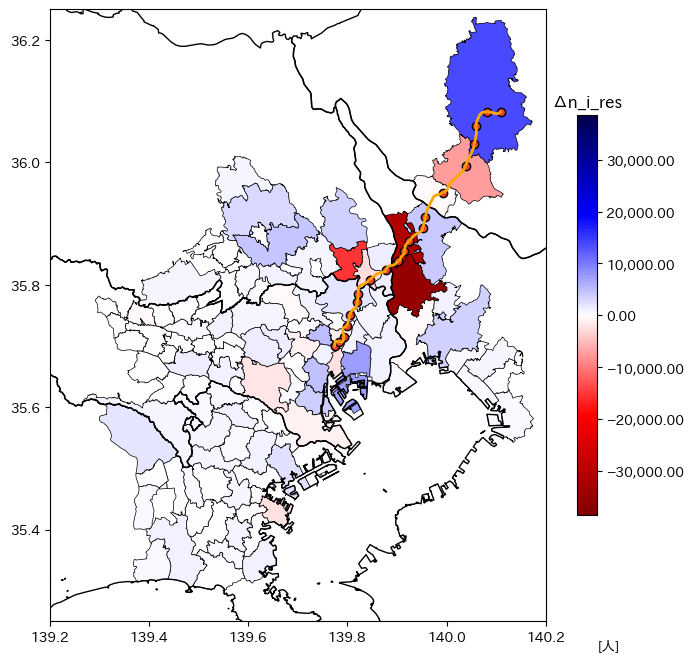

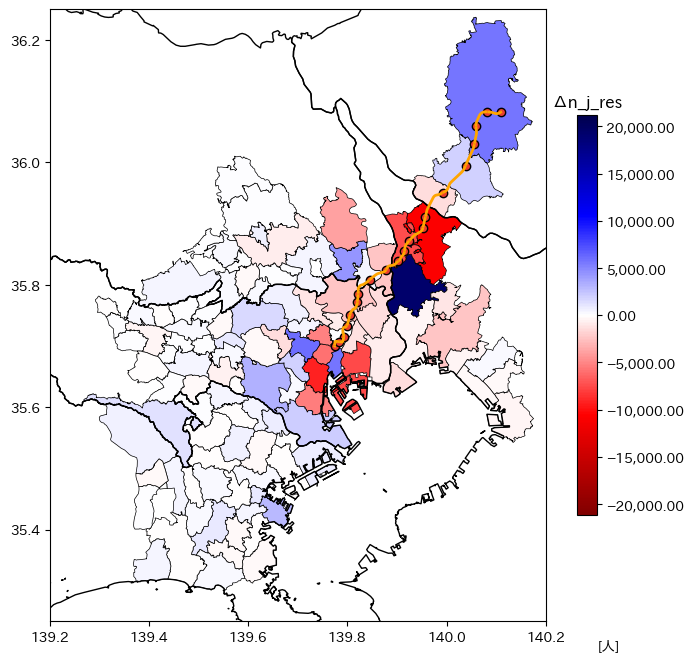

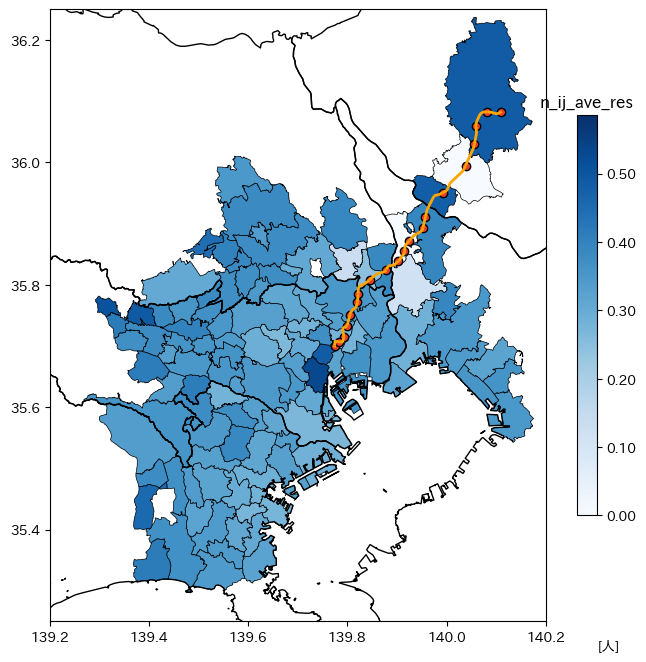

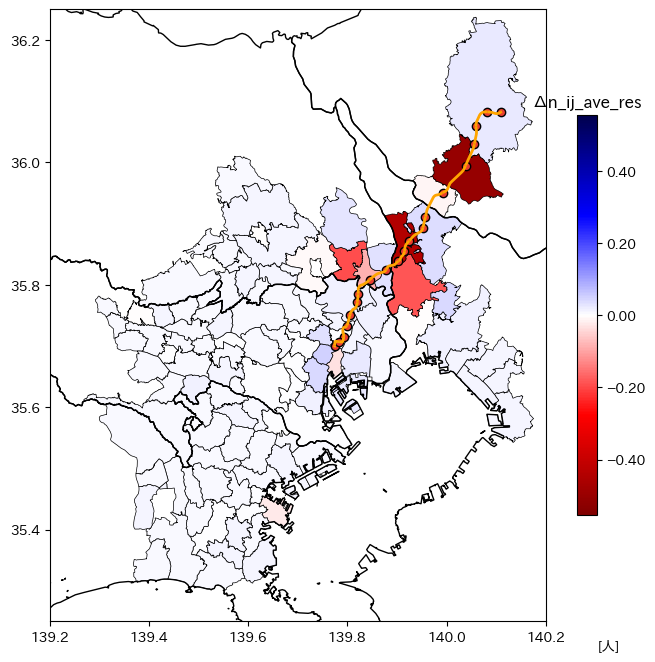

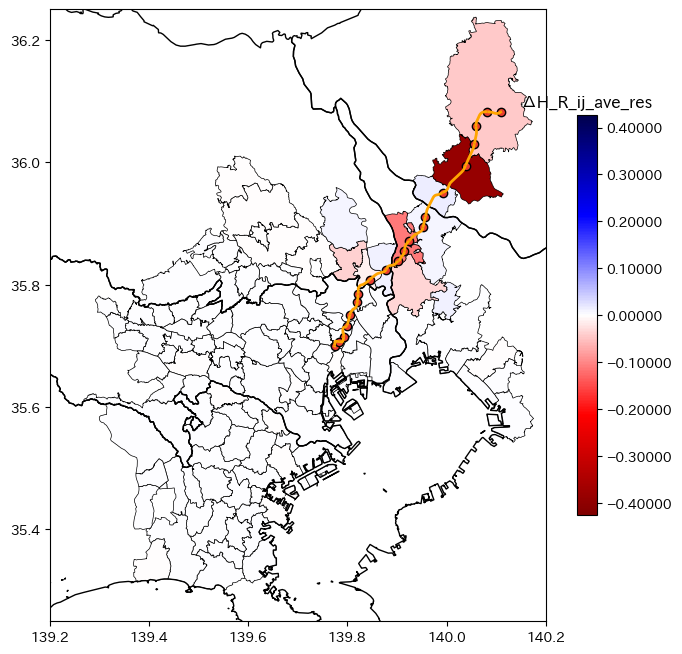

In [5]:
# f_3 simulation
dirname = 'simulation_tx_t_ij'
exog = f_1.exog_next
ref = f_1.ref_next
#res = f_3.res_next
data = '20250104_125607'
with open(f"results/{dirname}/{data}.pkl", "rb") as f: res = pickle.load(f)

print('子供の総数の推定値: ', np.sum(exog['N']*res['Pi_ij']*res['n_ij']))
print('子供の総数の実測値: ', np.sum(ref['n_i']))
print('推定値と実測値の差: ', np.sum(exog['N']*res['Pi_ij']*res['n_ij'])-np.sum(ref['n_i']))

df_ij_res = pd.DataFrame({
    'jcode': jcode,
    'n_i_res': np.sum(exog['N']*res['Pi_ij']*res['n_ij'], axis=1),
    'Δn_i_res': np.sum(exog['N']*res['Pi_ij']*res['n_ij'], axis=1)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1),
    'n_j_res': np.sum(exog['N']*res['Pi_ij']*res['n_ij'], axis=0),
    'Δn_j_res': np.sum(exog['N']*res['Pi_ij']*res['n_ij'], axis=0)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=0),
    'H_R_ij_ave_res': np.sum(res['H_R_ij']*exog['N']*res['Pi_ij'], axis=1)/res['N_R_i'],
    'ΔH_R_ij_ave_res': np.sum(res['H_R_ij']*exog['N']*res['Pi_ij'], axis=1)/res['N_R_i'] - np.sum(ref['H_R_ij']*exog['N']*ref['Pi_ij'], axis=1)/ref['N_R_i'],
    'n_ij_ave_res': np.sum(exog['N']*res['Pi_ij']*res['n_ij'], axis=1)/res['N_R_i'],
    'Δn_ij_ave_res': np.sum(exog['N']*res['Pi_ij']*res['n_ij'], axis=1)/res['N_R_i'] - np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1)/ref['N_R_i'],
})
gdf_vis_res = gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_res':res['N_R_i']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'ΔN_R_i_res':res['N_R_i']-ref['N_R_i']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'N_W_j_res':res['N_W_j']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'ΔN_W_j_res':res['N_W_j']-ref['N_W_j']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'H_R_i_res':res['H_R_i']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'H_W_j_res':res['H_W_j']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'H_i_res':res['H_i']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'A_j_res':res['A_j']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'B_i_res':res['B_i']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'q_i_res':res['q_i']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'Q_j_res':res['Q_j']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'w_j_res':res['w_j']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'Ups_res':res['Ups_j']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(pd.DataFrame({'jcode':jcode,'Omg_res':res['Omega_i']}), on='jcode', how='left')
gdf_vis_res = gdf_vis_res.merge(df_ij_res, on='jcode', how='left')

plot_gdf_tx(gdf_vis_res, dirname, 'w_j_res', '', '{x:,.1f}')
plot_gdf_tx(gdf_vis_res, dirname, 'q_i_res', '', '{x:,.1f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Q_j_res', '', '{x:,.1f}')
plot_gdf_tx(gdf_vis_res, dirname, 'A_j_res', '', '{x:,.1f}')
plot_gdf_tx(gdf_vis_res, dirname, 'B_i_res', '', '{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'N_W_j_res', '[人]', '{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'ΔN_W_j_res', '[人]', '{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'N_R_i_res', '[人]', '{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'ΔN_R_i_res', '[人]', '{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Δn_i_res', '[人]', '{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Δn_j_res', '[人]', '{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'n_ij_ave_res', '[人]', '{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Δn_ij_ave_res', '[人]', '{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'ΔH_R_ij_ave_res', '', '{x:,.5f}')

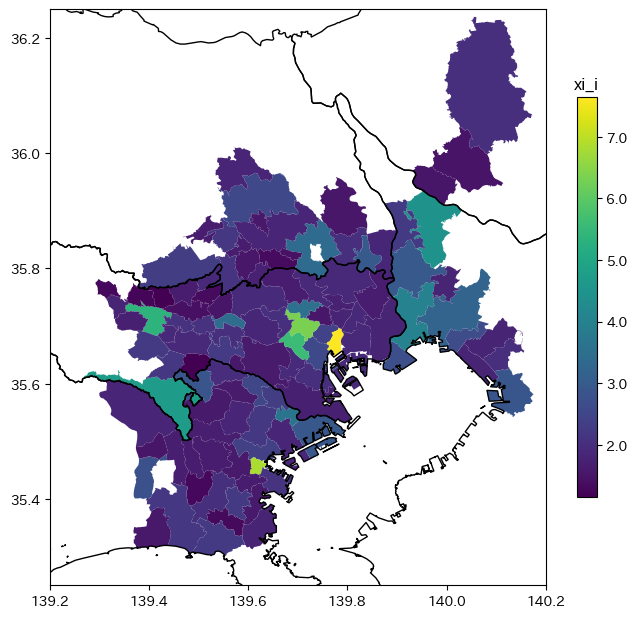

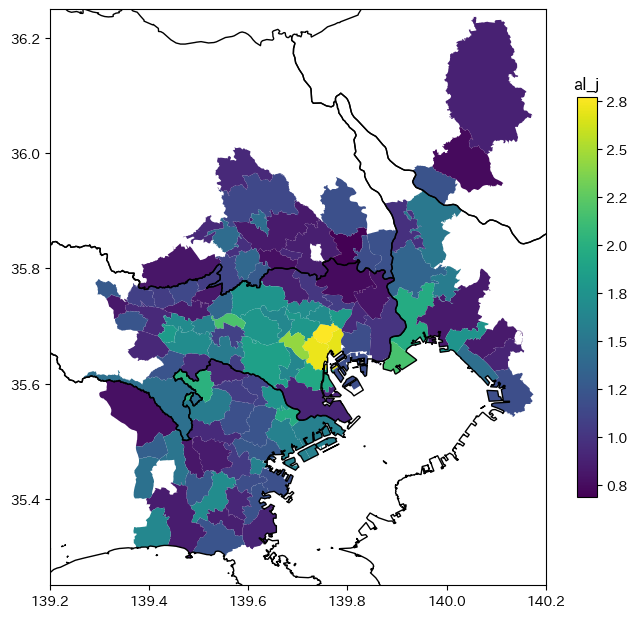

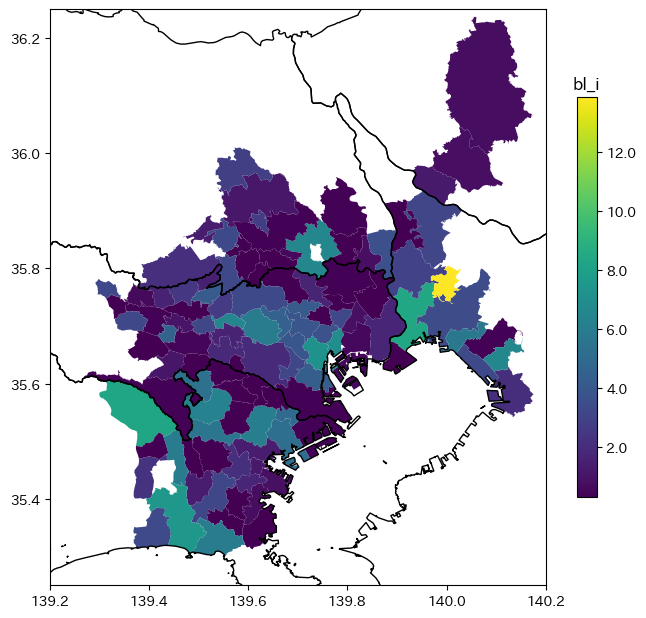

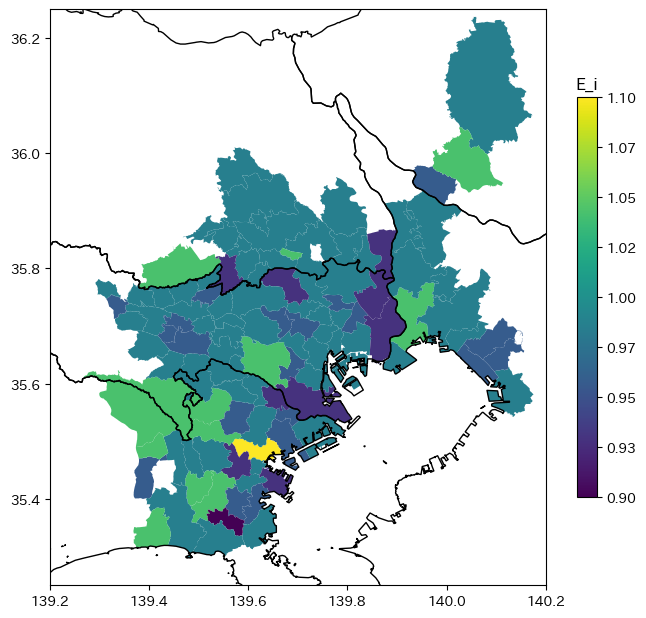

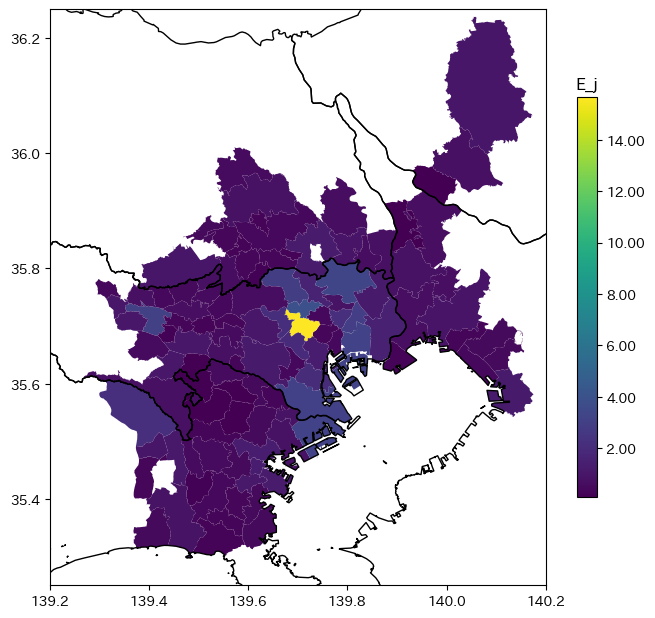

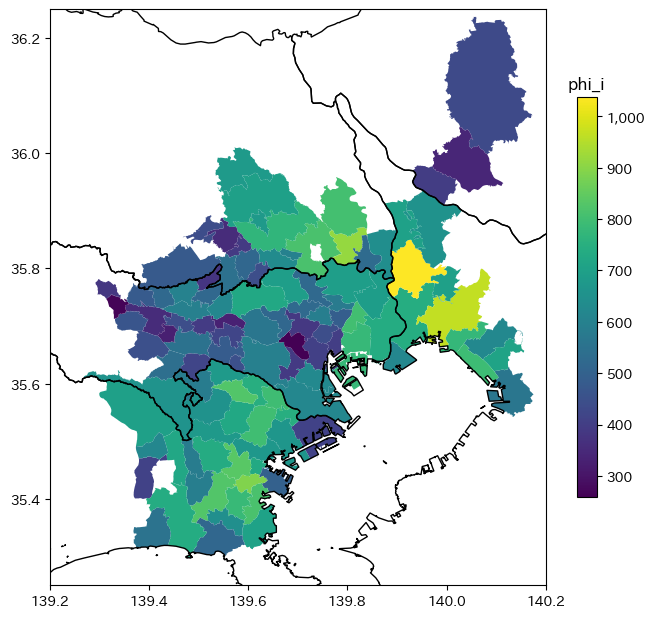

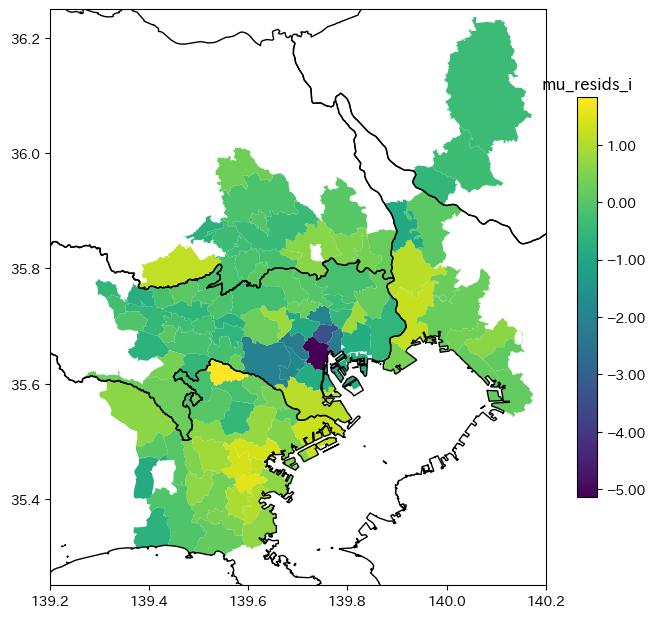

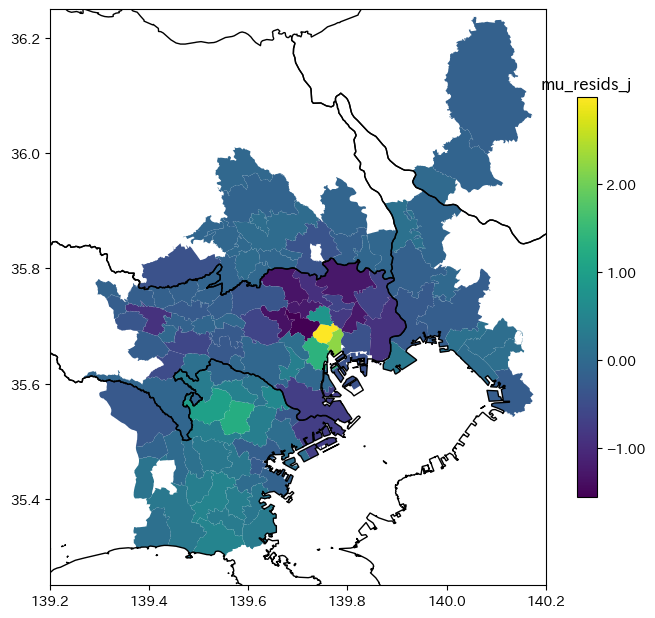

In [22]:
# f_2 fundmentals
dirname = 'fund_next'
exog = f_2.exog_next
ref = f_2.ref_next

df_ij_fund = pd.DataFrame({
    'jcode': jcode,
    'mu_resids_i': np.sum(exog['mu_resids_ij'], axis=1),
    'mu_resids_j': np.sum(exog['mu_resids_ij'], axis=0),
    'E_i': np.sum(exog['E_j'], axis=1),
    'E_j': np.sum(exog['E_j'], axis=0),
})

gdf_vis_fund = gdf.merge(pd.DataFrame({'jcode':jcode,'xi_i':exog['xi_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'al_j':exog['al_j']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'bl_i':exog['bl_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'phi_i':exog['phi_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(df_ij_fund, on='jcode', how='left')

plot_gdf(gdf_vis_fund, dirname, 'xi_i', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'al_j', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'bl_i', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'E_i', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'E_j', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'phi_i', '', '{x:,.0f}')
plot_gdf(gdf_vis_fund, dirname, 'mu_resids_i', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'mu_resids_j', '', '{x:,.2f}')

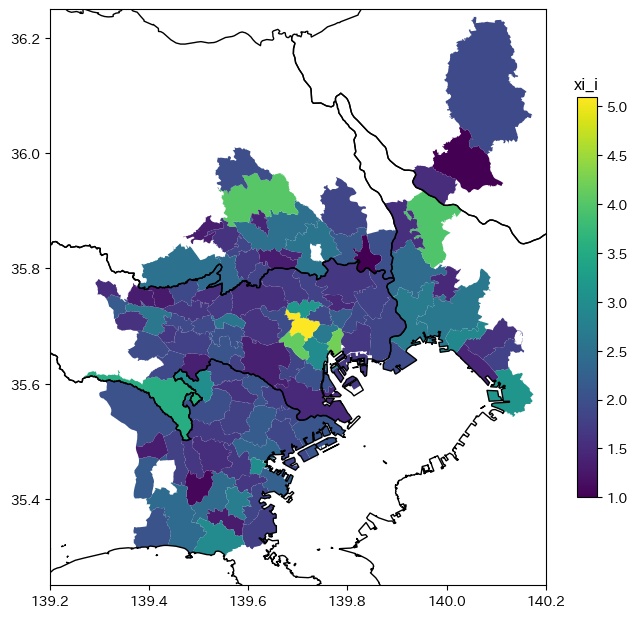

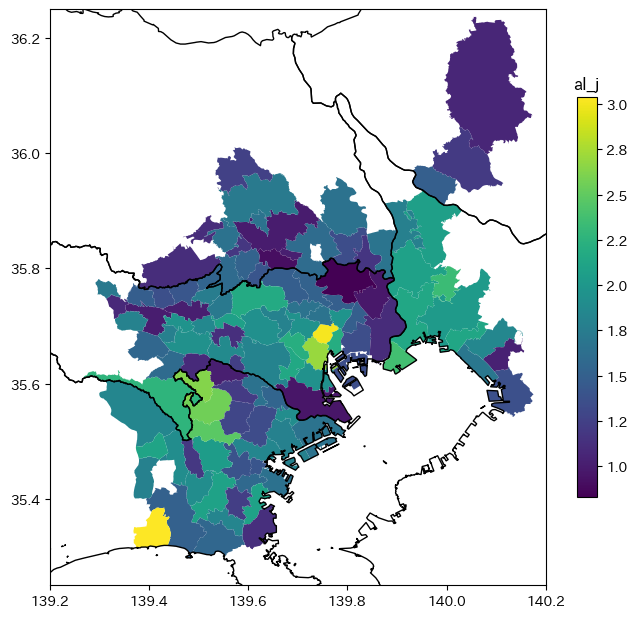

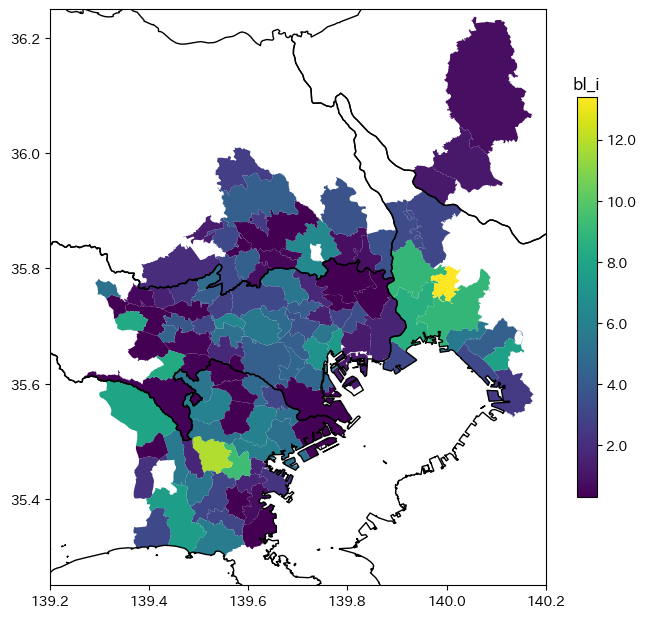

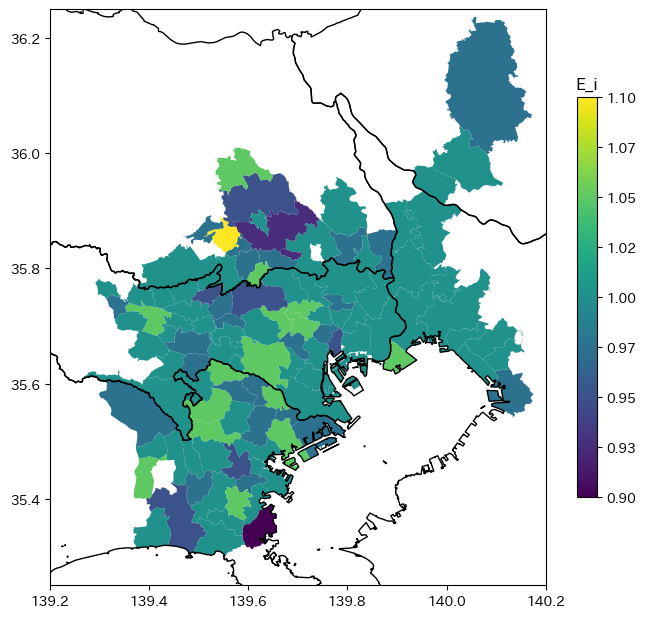

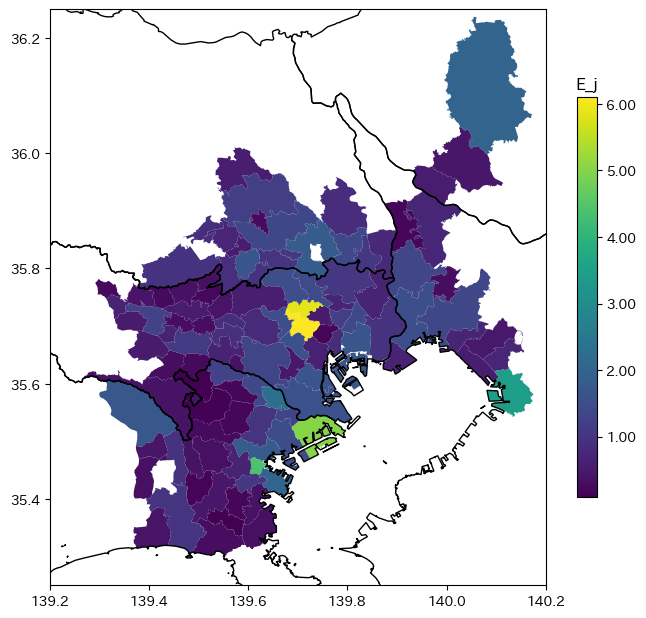

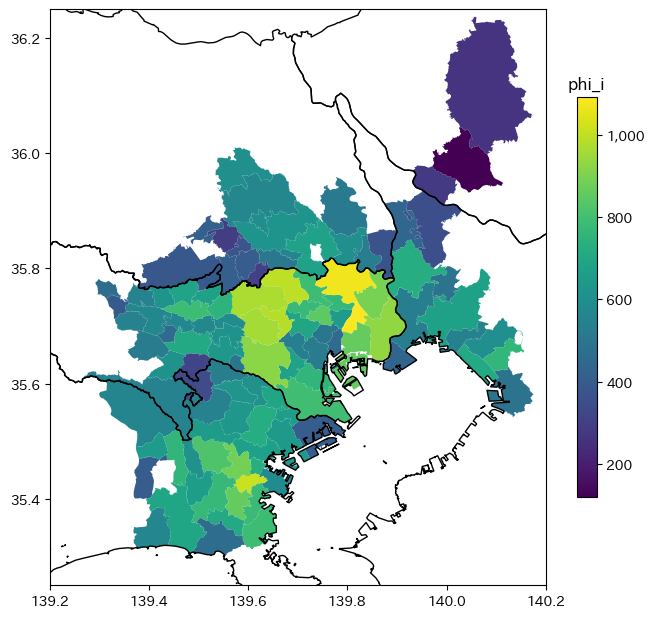

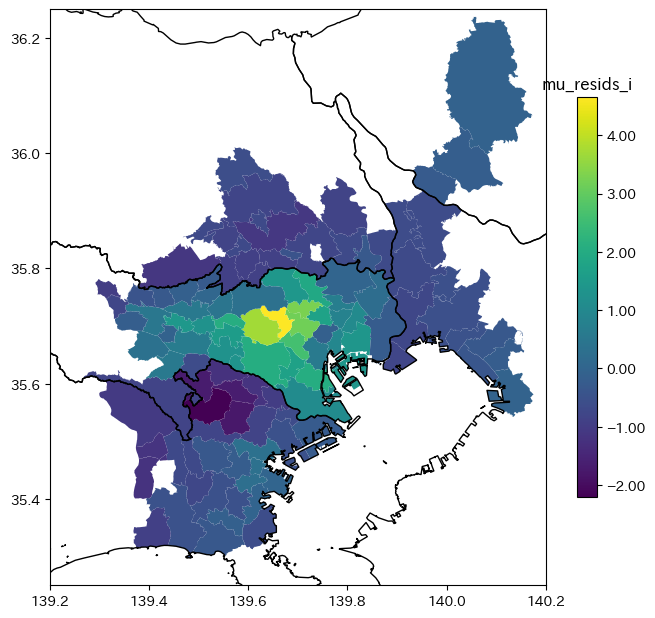

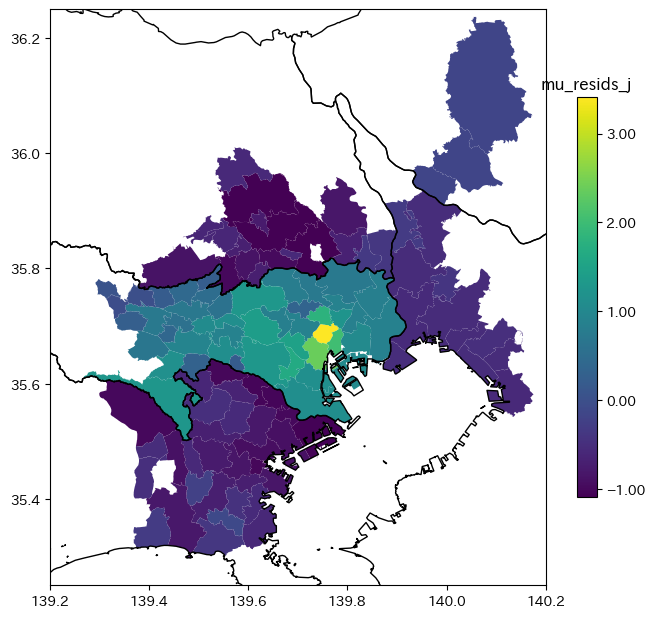

In [21]:
# f_2 fundmentals
dirname = 'fund_prev'
exog = f_2.exog_prev
ref = f_2.ref_prev

df_ij_fund = pd.DataFrame({
    'jcode': jcode,
    'mu_resids_i': np.sum(exog['mu_resids_ij'], axis=1),
    'mu_resids_j': np.sum(exog['mu_resids_ij'], axis=0),
    'E_i': np.sum(exog['E_j'], axis=1),
    'E_j': np.sum(exog['E_j'], axis=0),
})

gdf_vis_fund = gdf.merge(pd.DataFrame({'jcode':jcode,'xi_i':exog['xi_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'al_j':exog['al_j']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'bl_i':exog['bl_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'phi_i':exog['phi_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(df_ij_fund, on='jcode', how='left')

plot_gdf(gdf_vis_fund, dirname, 'xi_i', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'al_j', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'bl_i', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'E_i', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'E_j', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'phi_i', '', '{x:,.0f}')
plot_gdf(gdf_vis_fund, dirname, 'mu_resids_i', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'mu_resids_j', '', '{x:,.2f}')

子供の総数の実測値:  3326439.5474385065
子供の総数の推定値:  3326439.638758836
実測値と推定値の差:  -0.09132032934576273


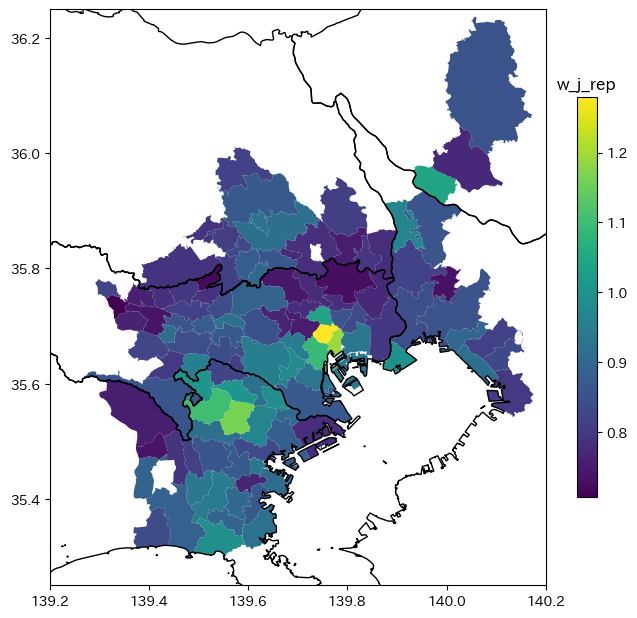

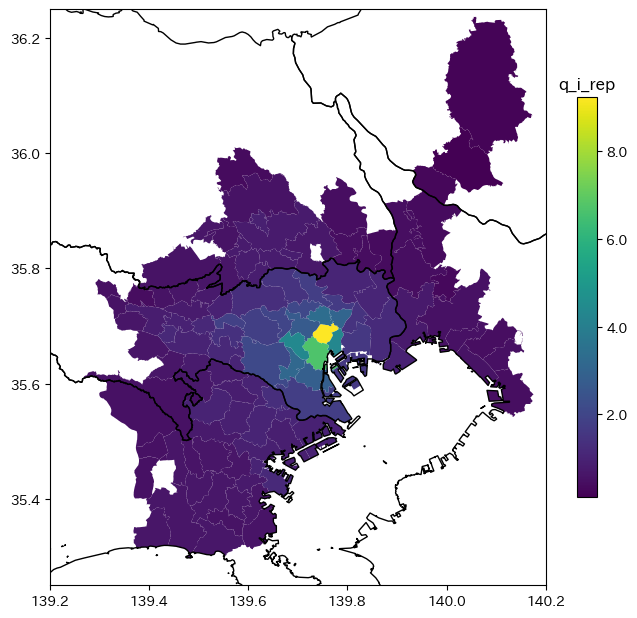

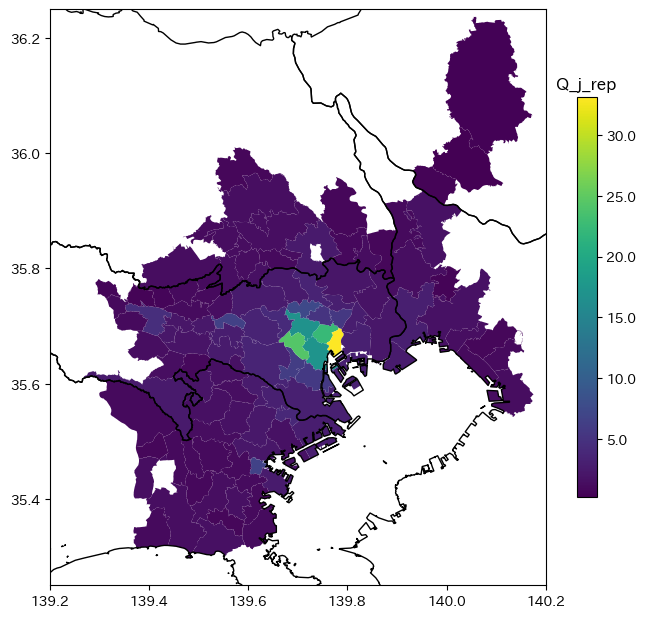

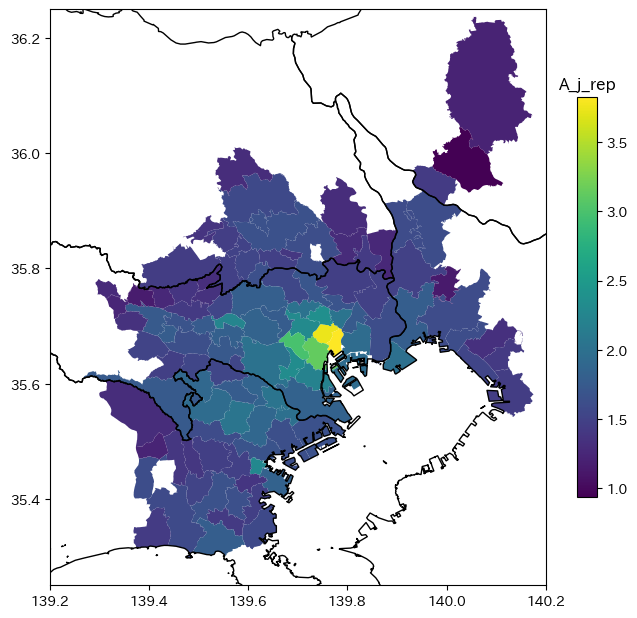

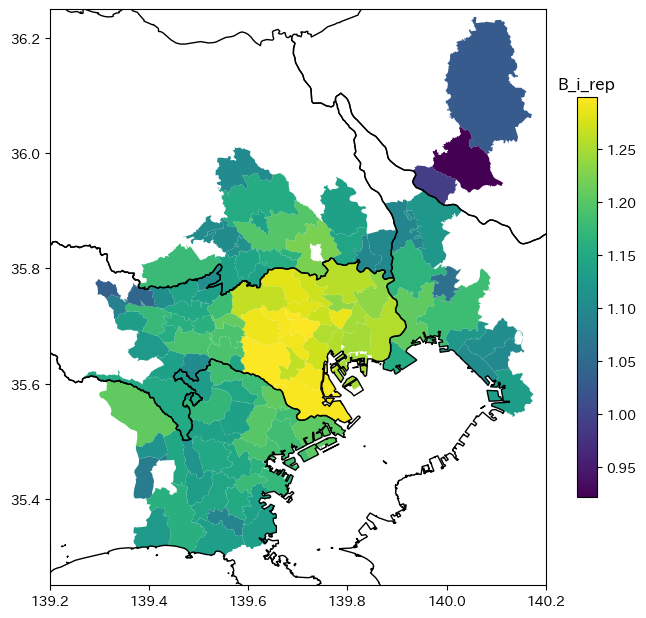

...

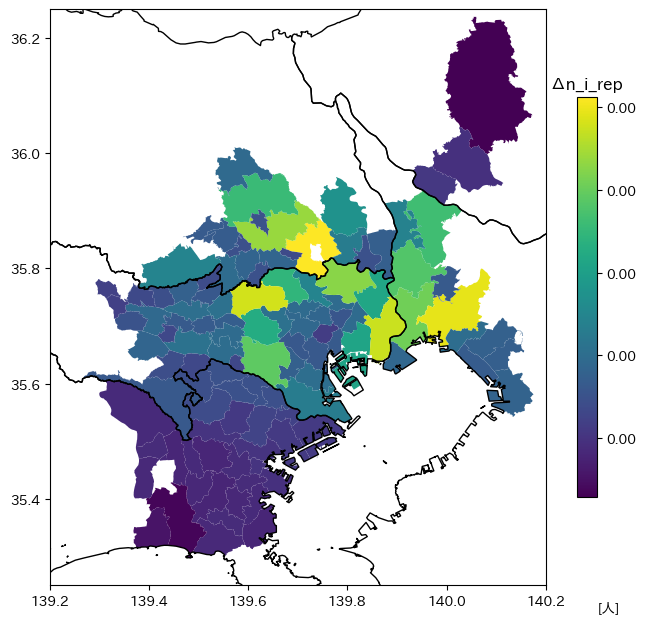

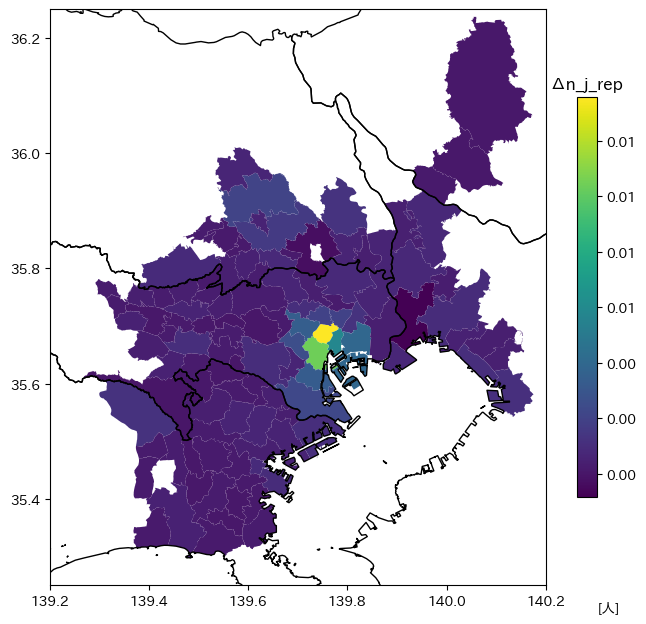

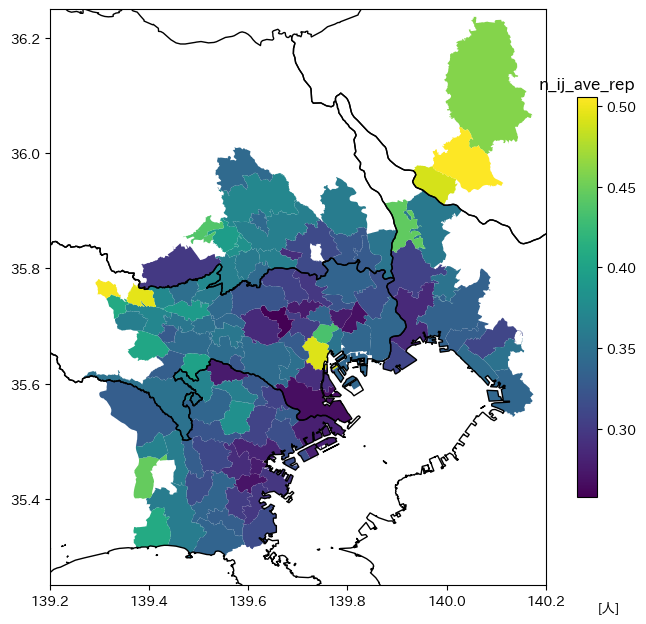

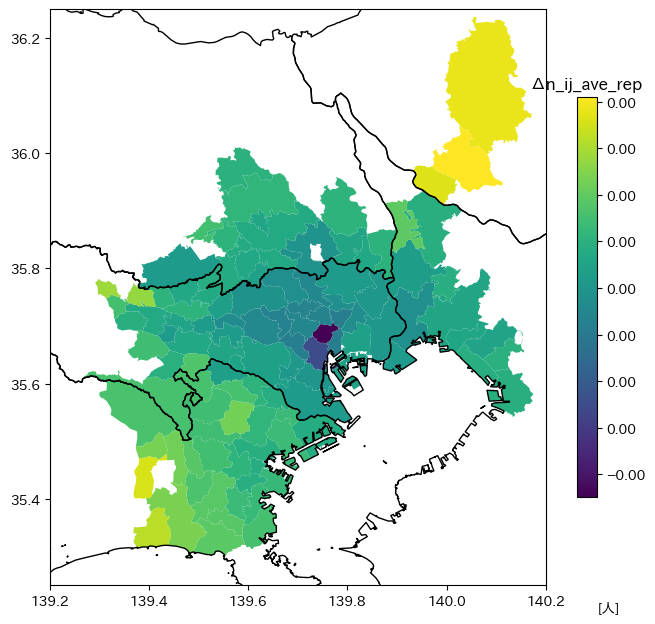

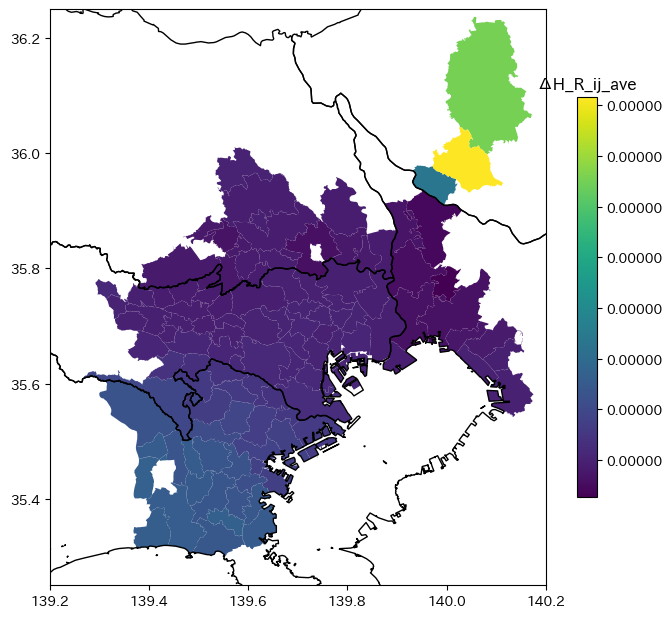

In [ ]:
# f_3 replication
dirname = 'replication_next'
exog = f_3.exog_next
ref = f_3.ref_next
rep = f_3.rep_next

print('子供の総数の実測値: ', np.sum(ref['n_i']))
print('子供の総数の推定値: ', np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
print('実測値と推定値の差: ', np.sum(ref['n_i'])-np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
df_ij_rep = pd.DataFrame({
    'jcode': jcode,
    'n_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1),
    'Δn_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1),
    'n_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0),
    'Δn_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=0),
    'H_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'],
    'ΔH_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'] - np.sum(ref['H_R_ij']*exog['N']*ref['Pi_ij'], axis=1)/ref['N_R_i'],
    'n_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'],
    'Δn_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'] - np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1)/ref['N_R_i'],
})
gdf_vis_rep = gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_rep':rep['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_R_i_rep':rep['N_R_i']-ref['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'N_W_j_rep':rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_W_j_rep':rep['N_W_j']-rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_R_i_rep':rep['H_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_W_j_rep':rep['H_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_i_rep':rep['H_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'A_j_rep':rep['A_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'B_i_rep':rep['B_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'q_i_rep':rep['q_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Q_j_rep':rep['Q_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'w_j_rep':rep['w_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Ups_rep':rep['Ups_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Omg_rep':rep['Omega_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(df_ij_rep, on='jcode', how='left')

plot_gdf(gdf_vis_rep, dirname, 'w_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'q_i_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'Q_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'A_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'B_i_rep', '', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'N_W_j_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'N_R_i_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_i_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_j_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'n_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'ΔH_R_ij_ave', '', '{x:,.5f}')

子供の総数の実測値:  3177377.089761221
子供の総数の推定値:  3177376.966605027
実測値と推定値の差:  0.12315619364380836


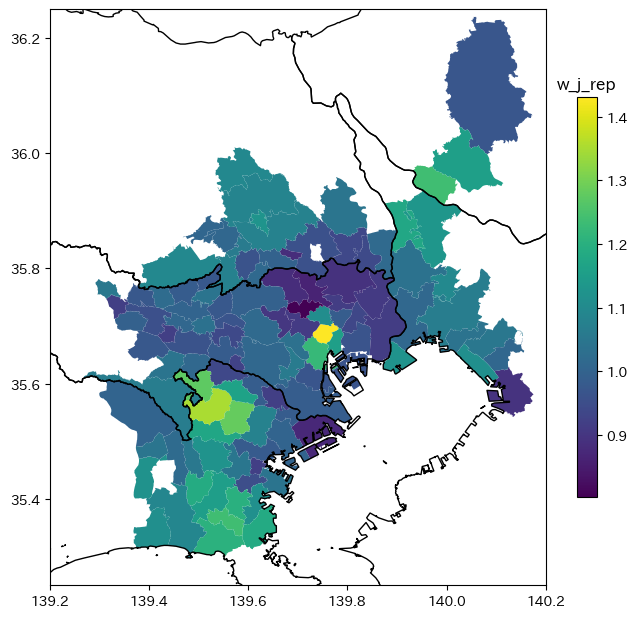

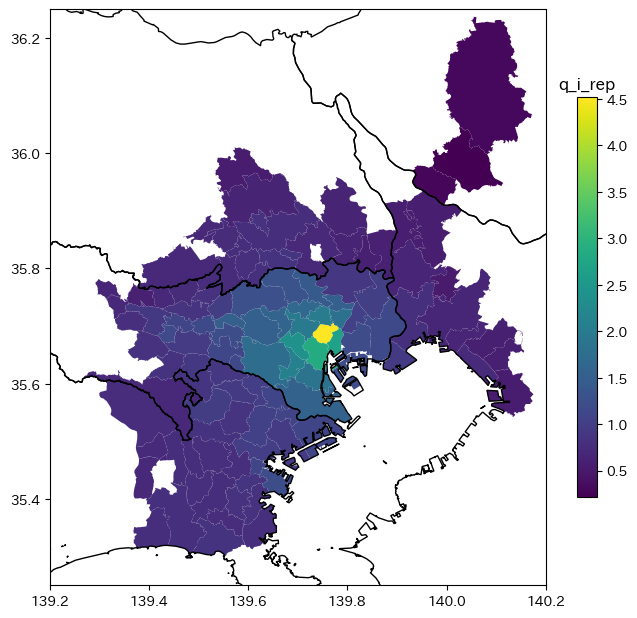

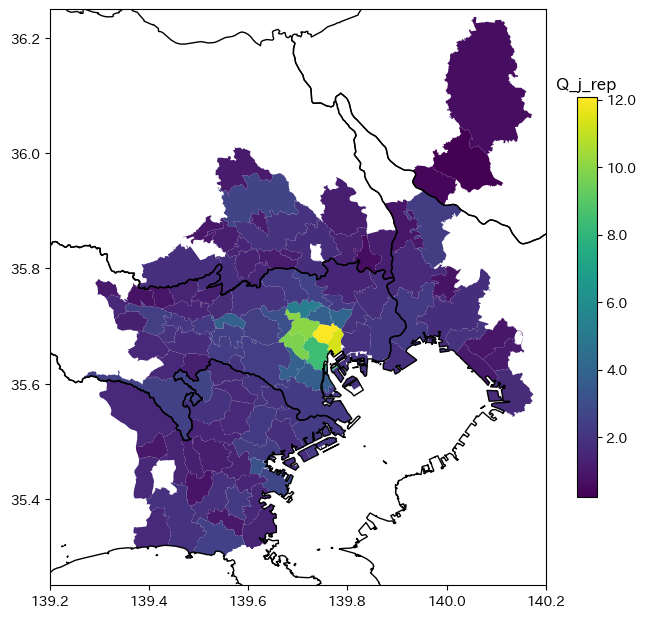

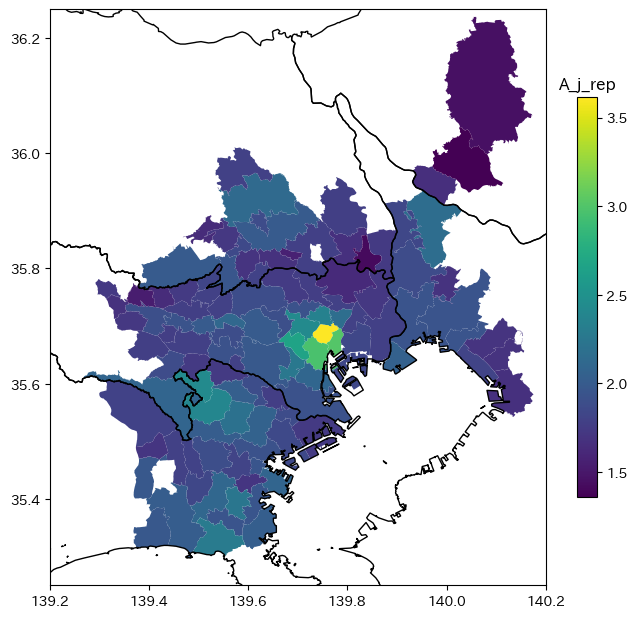

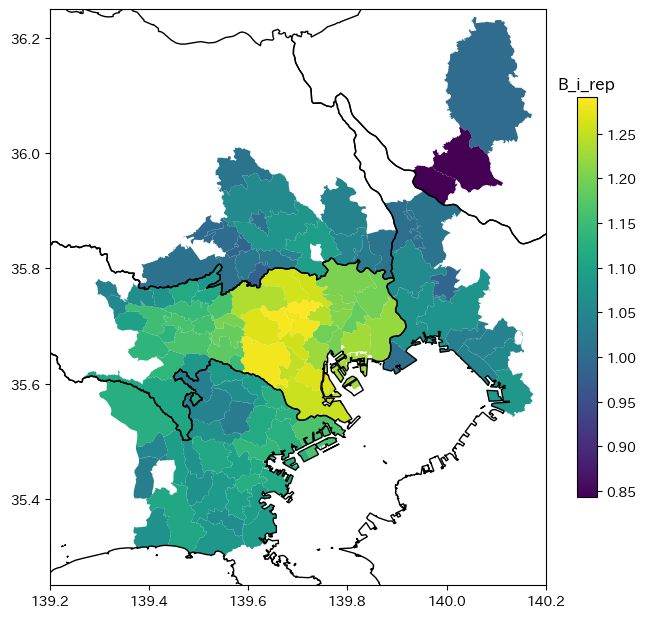

...

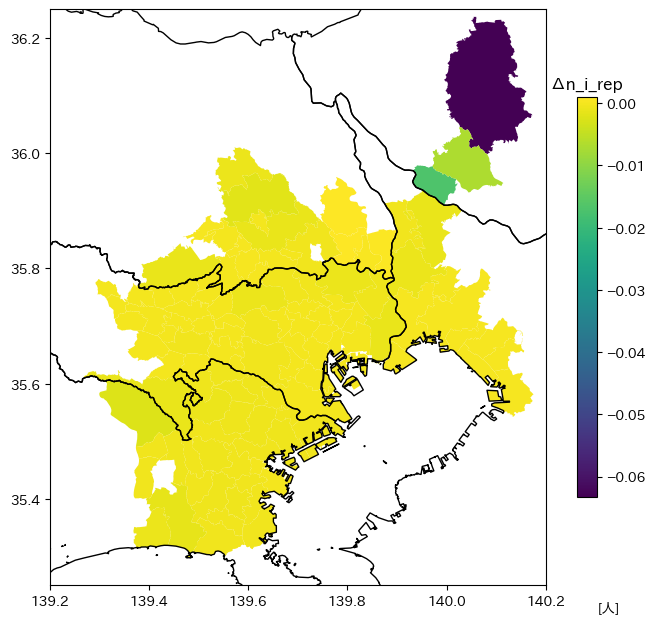

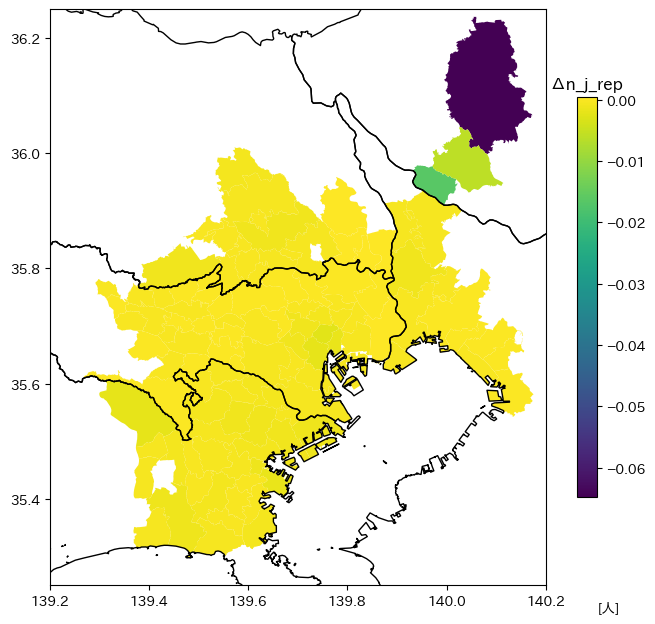

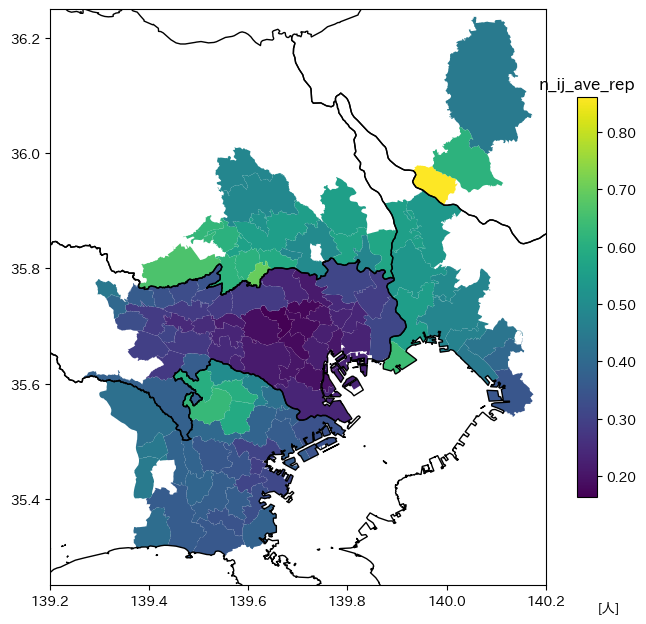

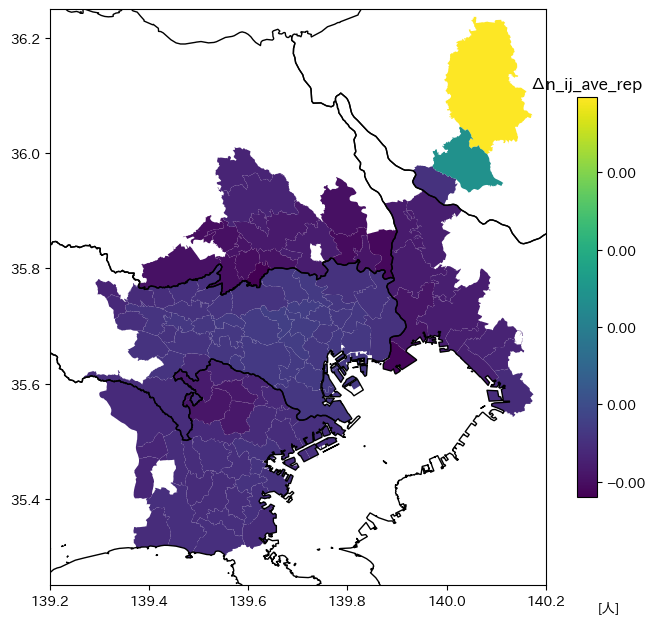

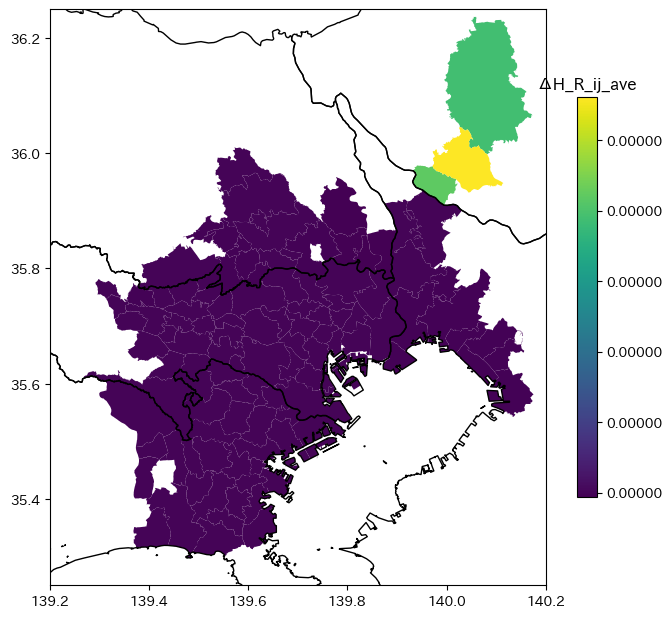

In [26]:
# f_3 replication
dirname = 'replication_prev'
exog = f_3.exog_prev
ref = f_3.ref_prev
rep = f_3.rep_prev

print('子供の総数の実測値: ', np.sum(ref['n_i']))
print('子供の総数の推定値: ', np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
print('実測値と推定値の差: ', np.sum(ref['n_i'])-np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
df_Pi_ij_rep = pd.DataFrame({
    'jcode': jcode,
    'n_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1),
    'Δn_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1),
    'n_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0),
    'Δn_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=0),
    'H_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'],
    'ΔH_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'] - np.sum(ref['H_R_ij']*exog['N']*ref['Pi_ij'], axis=1)/ref['N_R_i'],
    'n_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'],
    'Δn_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'] - np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1)/ref['N_R_i'],
})
gdf_vis_rep = gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_rep':rep['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_R_i_rep':rep['N_R_i']-ref['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'N_W_j_rep':rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_W_j_rep':rep['N_W_j']-rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_R_i_rep':rep['H_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_W_j_rep':rep['H_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_i_rep':rep['H_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'A_j_rep':rep['A_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'B_i_rep':rep['B_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'q_i_rep':rep['q_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Q_j_rep':rep['Q_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'w_j_rep':rep['w_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Ups_rep':rep['Ups_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Omg_rep':rep['Omega_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(df_Pi_ij_rep, on='jcode', how='left')

plot_gdf(gdf_vis_rep, dirname, 'w_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'q_i_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'Q_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'A_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'B_i_rep', '', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'N_W_j_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'N_R_i_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_i_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_j_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'n_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'ΔH_R_ij_ave', '', '{x:,.5f}')